# Setup

Editable configuration parameters

In [ ]:
USE_SD3 = True

# Data Config
DS_NAME = "ozgung/red-bowl-5"
#DS_NAME = "ozgung/red-bowl"
#DS_NAME = "ozgung/tubik"
#DS_NAME = "ozgung/bladerunner2049"

INSTANCE_PROMPT = "a photo of sks bowl"
TEST_PROMPT = "a photo of sks bowl with grapes in it"

TRAIN_MODEL = False # Train or load finetuned from Hub

# Training params
LEARNING_RATE = 5e-6
TRAIN_STEPS = 800

In [ ]:
MODEL_NAME = DS_NAME + ("-SD3" if USE_SD3 else "-SD")

In [ ]:
# Install Diffusers Library and Requirements for DreamBooth
!git clone https://github.com/ozgung/diffusers

!pip install -qq ./diffusers
if USE_SD3:
  !pip install -qq -r ./diffusers/examples/dreambooth/requirements_sd3.txt
else:
  !pip install -qq -r ./diffusers/examples/dreambooth/requirements.txt

!pip install -qq bitsandbytes

Cloning into 'diffusers'...
remote: Enumerating objects: 47391, done.
remote: Counting objects: 100% (15254/15254), done.
remote: Compressing objects: 100% (1635/1635), done.
remote: Total 47391 (delta 14534), reused 13619 (delta 13619), pack-reused 32137
Receiving objects: 100% (47391/47391), 39.45 MiB | 14.32 MiB/s, done.
Resolving deltas: 100% (35443/35443), done.
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 309.4/309.4 kB 9.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.4/54.4 kB 6.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 251.6/251.6 kB 32.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.3/21.3 MB 60.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 119.8/119.8 MB 5.2 MB/s eta 0:00:00


In [ ]:
import torch
from accelerate.utils import write_basic_config

write_basic_config()
assert torch.cuda.is_available(), "CUDA is not available. Consider choosing a GPU runtime."

## Login to HuggingFace

In [ ]:
# Enter token for HuggingFace
from huggingface_hub import notebook_login
notebook_login()


#Prepare Data

In [ ]:
from huggingface_hub import snapshot_download
import shutil, os.path

local_dir = os.path.join('./IN', MODEL_NAME)
output_dir = os.path.join("./OUT", MODEL_NAME)

snapshot_download(
    DS_NAME,
    local_dir=local_dir,
    repo_type="dataset",
    allow_patterns=["*.jpeg", "*.jpg", "*.png"],
    ignore_patterns=[".gitattributes","*.md"],
)

shutil.rmtree(os.path.join(local_dir,'.huggingface/'))


/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


Fetching 5 files:   0%|          | 0/5 [00:00<?, ?it/s]

IMG_2874.jpeg:   0%|          | 0.00/1.21M [00:00<?, ?B/s]

IMG_2879.jpeg:   0%|          | 0.00/2.11M [00:00<?, ?B/s]

IMG_2872.jpeg:   0%|          | 0.00/2.59M [00:00<?, ?B/s]

IMG_2876.jpeg:   0%|          | 0.00/2.90M [00:00<?, ?B/s]

IMG_2878.jpeg:   0%|          | 0.00/2.24M [00:00<?, ?B/s]

#Train

In [ ]:
BASE_MODEL = "stabilityai/stable-diffusion-3-medium-diffusers" if USE_SD3 else "runwayml/stable-diffusion-v1-5"

if USE_SD3:
  train_cmd = f"""
accelerate launch diffusers/examples/dreambooth/train_dreambooth_sd3.py \
  --pretrained_model_name_or_path="{BASE_MODEL}"  \
  --instance_data_dir="{local_dir}" \
  --output_dir="{output_dir}" \
  --instance_prompt="{INSTANCE_PROMPT}" \
  --mixed_precision="fp16" \
  --resolution=512 \
  --train_batch_size=1 \
  --gradient_accumulation_steps=1 \
  --learning_rate={LEARNING_RATE} \
  --lr_scheduler="constant" \
  --lr_warmup_steps=0 \
  --max_train_steps={TRAIN_STEPS} \
  --use_8bit_adam \
  --gradient_checkpointing \
  --seed="0" \
  --push_to_hub
"""
else:
    train_cmd = f"""
accelerate launch diffusers/examples/dreambooth/train_dreambooth.py \
  --pretrained_model_name_or_path="{BASE_MODEL}"  \
  --instance_data_dir="{local_dir}" \
  --output_dir="{output_dir}" \
  --instance_prompt="{INSTANCE_PROMPT}" \
  --resolution=512 \
  --train_batch_size=1 \
  --gradient_accumulation_steps=1 \
  --learning_rate={LEARNING_RATE} \
  --lr_scheduler="constant" \
  --lr_warmup_steps=0 \
  --max_train_steps={TRAIN_STEPS} \
  --gradient_checkpointing \
  --seed="0" \
  --use_8bit_adam \
"""



# run command
print({train_cmd})
if TRAIN_MODEL:

  !{train_cmd}
else:
  print("Skipping training. Set TRAIN_MODEL to train model.")

{'\naccelerate launch diffusers/examples/dreambooth/train_dreambooth_sd3.py   --pretrained_model_name_or_path="stabilityai/stable-diffusion-3-medium-diffusers"    --instance_data_dir="./IN/ozgung/red-bowl-5-SD3"   --output_dir="./OUT/ozgung/red-bowl-5-SD3"   --instance_prompt="a photo of sks bowl"   --mixed_precision="fp16"   --resolution=512   --train_batch_size=1   --gradient_accumulation_steps=1   --learning_rate=5e-06   --lr_scheduler="constant"   --lr_warmup_steps=0   --max_train_steps=800   --use_8bit_adam   --gradient_checkpointing   --seed="0"   --push_to_hub\n'}
Skipping training. Set TRAIN_MODEL to train model.


## Upload to Hub


In [ ]:
if TRAIN_MODEL:
  # Upload model to hub
  from huggingface_hub import create_repo, upload_folder

  # HF WRITE token
  from huggingface_hub import notebook_login
  notebook_login()

  # create a repo on the huggingface hub
  create_repo(MODEL_NAME, exist_ok=True)

  # upload the model folder
  upload_folder(
      folder_path=output_dir,
      repo_id=MODEL_NAME,
  )

events.out.tfevents.1719333157.a6c44f6c666f.15673.1:   0%|          | 0.00/2.79k [00:00<?, ?B/s]

events.out.tfevents.1719333157.a6c44f6c666f.15673.0:   0%|          | 0.00/33.4k [00:00<?, ?B/s]

Upload 6 LFS files:   0%|          | 0/6 [00:00<?, ?it/s]

model.safetensors:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

CommitInfo(commit_url='https://huggingface.co/ozgung/bladerunner2049/commit/f3df6c507434cbbdeb7e0dd7085041cb084074ce', commit_message='Upload folder using huggingface_hub', commit_description='', oid='f3df6c507434cbbdeb7e0dd7085041cb084074ce', pr_url=None, pr_revision=None, pr_num=None)

# Inference

Create Inference Pipeline

In [ ]:
from diffusers import DiffusionPipeline
import torch

# Load model to pipeline
if TRAIN_MODEL:
  pipeline = DiffusionPipeline.from_pretrained(
      output_dir,
      torch_dtype=torch.float16,
      use_safetensors=True).to("cuda")
else:
  pipeline = DiffusionPipeline.from_pretrained(
    MODEL_NAME,
    torch_dtype=torch.float16,
    use_safetensors=True).to("cuda")


model_index.json:   0%|          | 0.00/776 [00:00<?, ?B/s]

Fetching 29 files:   0%|          | 0/29 [00:00<?, ?it/s]

scheduler/scheduler_config.json:   0%|          | 0.00/141 [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/746 [00:00<?, ?B/s]

text_encoder_3/config.json:   0%|          | 0.00/914 [00:00<?, ?B/s]

text_encoder_2/config.json:   0%|          | 0.00/744 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/2.78G [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/495M [00:00<?, ?B/s]

model-00001-of-00004.safetensors:   0%|          | 0.00/4.99G [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/8.34G [00:00<?, ?B/s]

(…)t_encoder_3/model.safetensors.index.json:   0%|          | 0.00/19.9k [00:00<?, ?B/s]

model-00003-of-00004.safetensors:   0%|          | 0.00/4.87G [00:00<?, ?B/s]

model-00004-of-00004.safetensors:   0%|          | 0.00/4.19G [00:00<?, ?B/s]

model-00002-of-00004.safetensors:   0%|          | 0.00/5.00G [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/588 [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/705 [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

tokenizer_2/special_tokens_map.json:   0%|          | 0.00/576 [00:00<?, ?B/s]

tokenizer_2/tokenizer_config.json:   0%|          | 0.00/856 [00:00<?, ?B/s]

tokenizer_3/special_tokens_map.json:   0%|          | 0.00/2.54k [00:00<?, ?B/s]

spiece.model:   0%|          | 0.00/792k [00:00<?, ?B/s]

tokenizer_3/tokenizer.json:   0%|          | 0.00/2.42M [00:00<?, ?B/s]

tokenizer_3/tokenizer_config.json:   0%|          | 0.00/20.6k [00:00<?, ?B/s]

transformer/config.json:   0%|          | 0.00/442 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/8.34G [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/902 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/9 [00:00<?, ?it/s]

Loading checkpoint shards:   0%|          | 0/4 [00:00<?, ?it/s]

You set `add_prefix_space`. The tokenizer needs to be converted from the slow tokenizers


  0%|          | 0/50 [00:00<?, ?it/s]

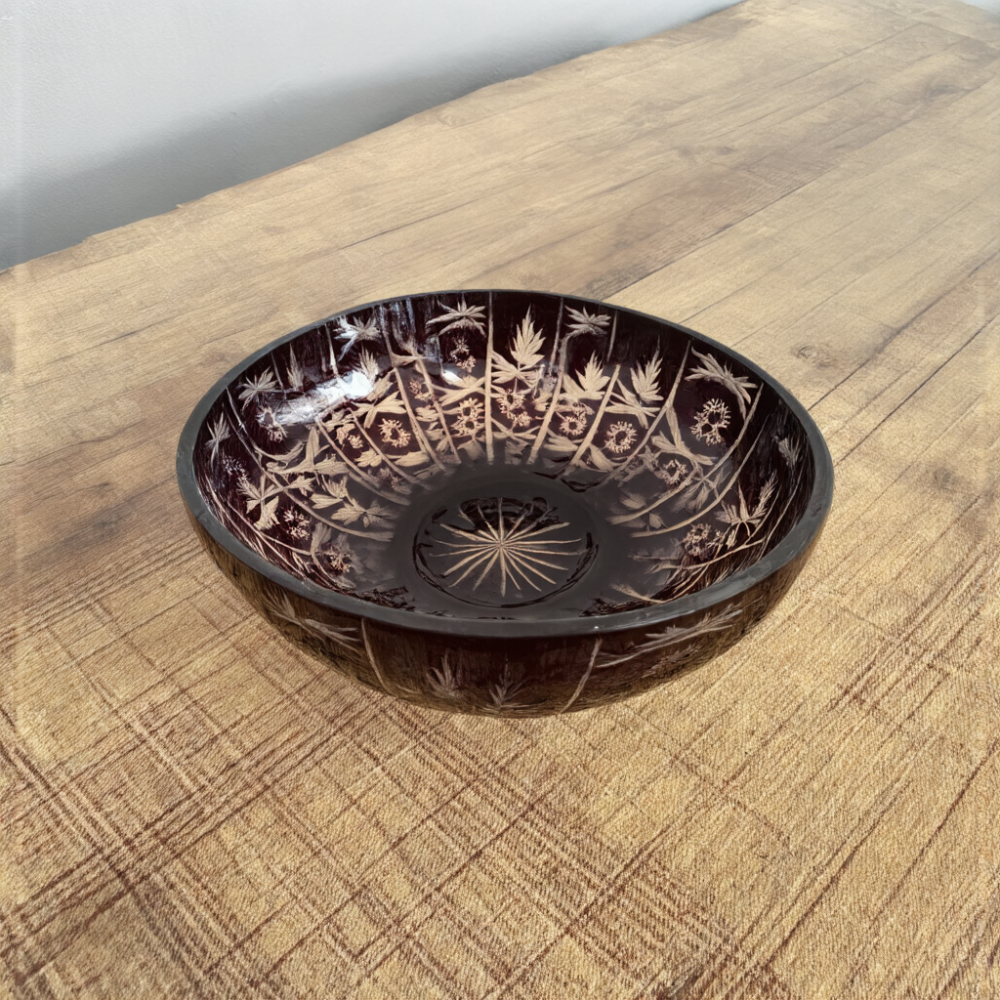

In [ ]:
image = pipeline(TEST_PROMPT, num_inference_steps=50, guidance_scale=7.5).images[0]
i=0
# create output dir if not exist
if not os.path.exists(output_dir):
    os.makedirs(output_dir)
image.save(os.path.join(output_dir, f"generated_image_{i}.png"))
image

  0%|          | 0/150 [00:00<?, ?it/s]

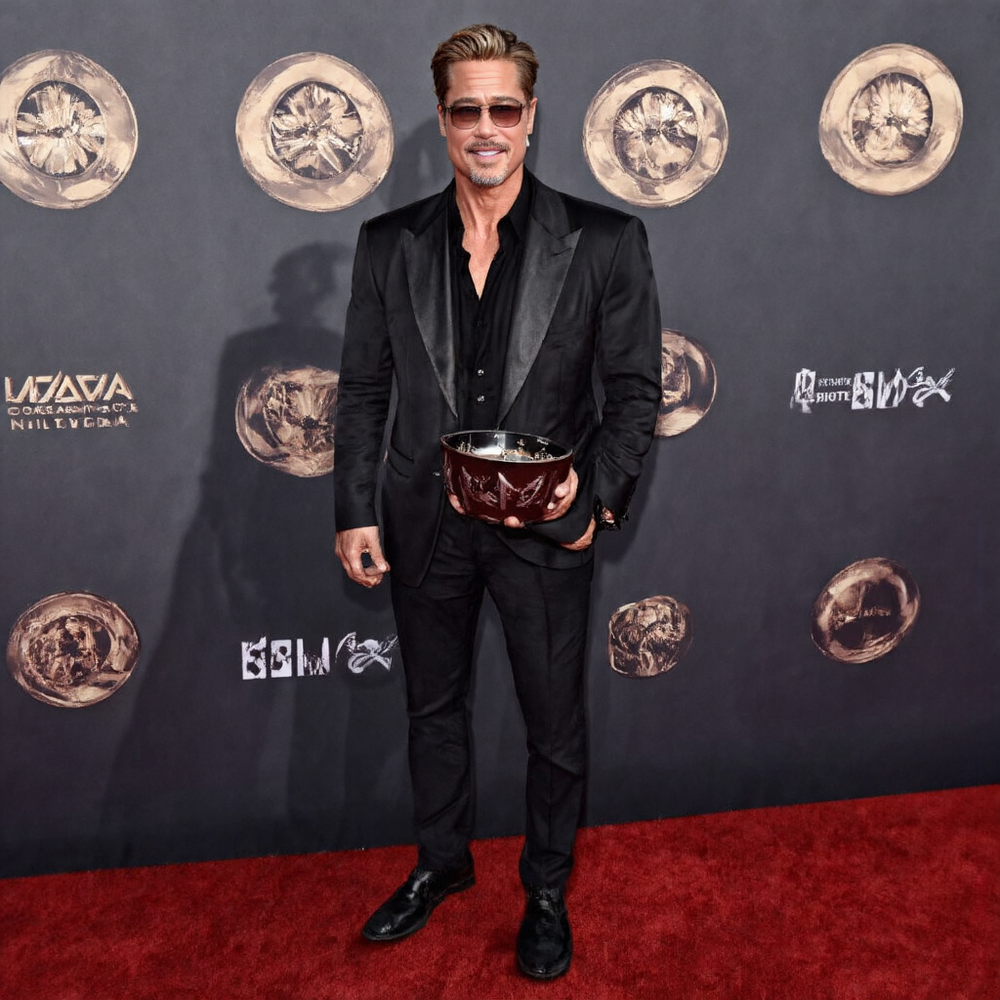

In [ ]:
# some more inference trials
NEW_PROMPT = "brad pitt holding a sks bowl"
i += 1
# manual seed
generator = torch.Generator("cuda").manual_seed(42)

image = pipeline(NEW_PROMPT, num_inference_steps=150, guidance_scale=7.5, generator=generator).images[0]
image.save(os.path.join(output_dir, f"42_GS175_S150_{NEW_PROMPT}_{i}.png"))
image

In [ ]:
#copy output folder to drive
from google.colab import drive
drive.mount('/content/drive')
# copy out folder to drive in python
shutil.copytree(output_dir, os.path.join('/content/drive/MyDrive/', DS_NAME), dirs_exist_ok=True)

Mounted at /content/drive


'/content/drive/MyDrive/ozgung/bladerunner2049'

# DDIM Scheduler for Inference



In [ ]:
from diffusers import DDIMScheduler
default_scheduler = pipeline.scheduler
print(default_scheduler)

ddim_scheduler = DDIMScheduler(beta_start=0.00085, beta_end=0.012, beta_schedule="scaled_linear", clip_sample=False, set_alpha_to_one=False)
print(ddim_scheduler)


In [ ]:
# some more inference trials with new scheduler
#NEW_PROMPT = "photo of dog in sks style"
i += 1

for steps in [50,100,150,200]:
  for gs in [.5,1, 3, 7.5, 15]:
    image = pipeline(NEW_PROMPT, num_inference_steps=steps, guidance_scale=gs, generator=generator, scheduler=ddim_scheduler).images[0]
    image.save(os.path.join(output_dir, f"DDIM_GS{str(gs)}_S{steps}_{NEW_PROMPT}_{i}.png"))
    image = pipeline(NEW_PROMPT, num_inference_steps=steps, guidance_scale=gs, generator=generator, scheduler=default_scheduler).images[0]
    image.save(os.path.join(output_dir, f"PNDMS_GS{str(gs)}_S{steps}_{NEW_PROMPT}_{i}.png"))


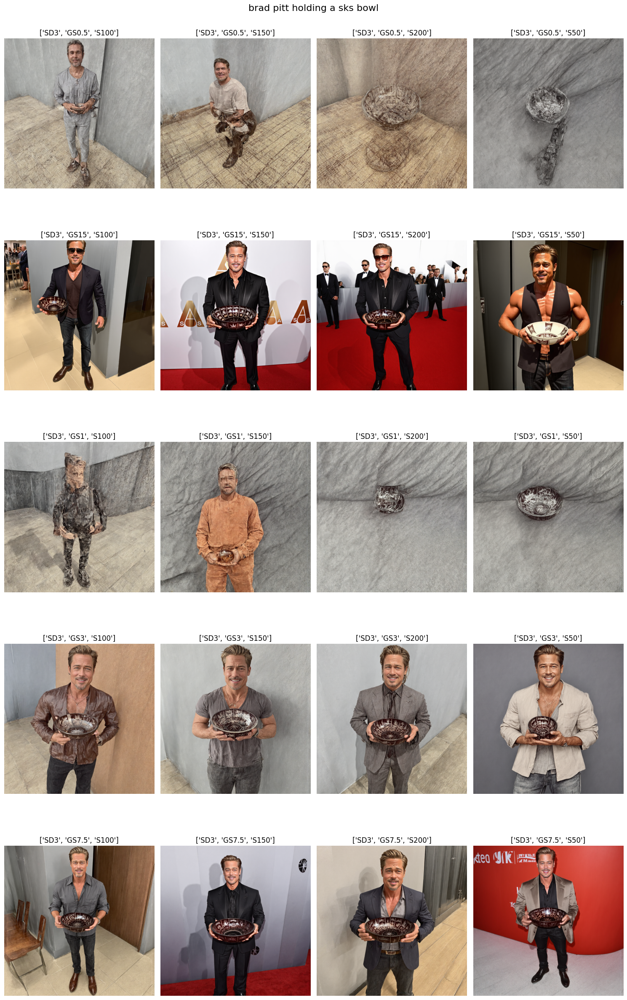

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os

# Assuming 'output_dir' is already defined as in your code
image_files = [f for f in os.listdir(output_dir) if f.startswith('PNDMS')]
image_files.sort()

# Adjust grid dimensions as needed
num_cols = 4
num_rows = 5

fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 5*num_rows))
fig.suptitle(image_files[0].split('_')[-2], fontsize=16)

for i, file in enumerate(image_files):
    row = i // num_cols
    col = i % num_cols
    img = mpimg.imread(os.path.join(output_dir, file))
    axes[row, col].imshow(img)
    axes[row, col].set_title(file.split('_')[0:3])
    axes[row, col].axis('off')

# Hide any unused subplots
for i in range(len(image_files), num_rows * num_cols):
    row = i // num_cols
    col = i % num_cols
    axes[row, col].axis('off')

plt.tight_layout()
plt.show()

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os

image_files = [f for f in os.listdir(output_dir) if f.startswith('DDIM')]
image_files.sort()

# Adjust grid dimensions as needed
num_cols = 4
num_rows = 5

fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 5*num_rows))
fig.suptitle(image_files[0].split('_')[-2], fontsize=16)

for i, file in enumerate(image_files):
    row = i // num_cols
    col = i % num_cols
    img = mpimg.imread(os.path.join(output_dir, file))
    axes[row, col].imshow(img)
    axes[row, col].set_title(file.split('_')[0:3])
    axes[row, col].axis('off')

# Hide any unused subplots
for i in range(len(image_files), num_rows * num_cols):
    row = i // num_cols
    col = i % num_cols
    axes[row, col].axis('off')

plt.tight_layout()
plt.show()

Package                          Version
-------------------------------- ---------------------
absl-py                          1.4.0
aiohttp                          3.9.5
aiosignal                        1.3.1
alabaster                        0.7.16
albumentations                   1.3.1
altair                           4.2.2
annotated-types                  0.7.0
anyio                            3.7.1
argon2-cffi                      23.1.0
argon2-cffi-bindings             21.2.0
array_record                     0.5.1
arviz                            0.15.1
astropy                          5.3.4
astunparse                       1.6.3
async-timeout                    4.0.3
atpublic                         4.1.0
attrs                            23.2.0
audioread                        3.0.1
autograd                         1.6.2
Babel                            2.15.0
backcall                         0.2.0
beautifulsoup4                   4.12.3
bidict                           0.23.1